# Airplane Detection For Satellites YOLOv8s

In [ ]:
import os
import numpy as np
import pandas as pd
import ast
import torch
import PIL
from tqdm.auto import tqdm
import shutil as sh
from pathlib import Path
import shutil
import random
import xml.etree.ElementTree as ET
import glob
import json

import IPython

from IPython.display import Image,display, clear_output
import matplotlib.pyplot as plt
%matplotlib inline

from google.colab import drive
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
# Pip install (recommended)
!pip install ultralytics==8.0.47


from IPython import display
display.clear_output()
!yolo checks

Ultralytics YOLOv8.0.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.9/78.2 GB disk)


In [ ]:
!pip install albumentations==1.0.3
display.clear_output()
!pip show albumentations

Name: albumentations

Version: 1.0.3

Summary: Fast image augmentation library and easy to use wrapper around other libraries

Home-page: https://github.com/albumentations-team/albumentations

Author: Buslaev Alexander, Alexander Parinov, Vladimir Iglovikov, Eugene Khvedchenya, Druzhinin Mikhail

Author-email: 

License: MIT

Location: /usr/local/lib/python3.8/dist-packages

Requires: numpy, opencv-python-headless, PyYAML, scikit-image, scipy

Required-by: 


## Restructure Files and Folders

In [ ]:
# IMAGE_DIR = {"train": Path("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/images/"),
#              "val": Path("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/images/")}
# #for _, folder in IMAGE_DIR.items():
#   if not os.path.isdir(folder):
#     os.makedirs(folder)
#   print(f"Image directory : {folder} ")

# ANNOTATIONS_DIR = {"train": Path("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/annotations/"),
#                    "val": Path("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/annotations/")}
# for _, folder in ANNOTATIONS_DIR.items():
#   if not os.path.isdir(folder):
#     os.makedirs(folder)
#   print(f"Annoatation directory : {folder} ")

Image directory : /content/drive/MyDrive/ML/airplane-detection-for-satellites/train/images 

Image directory : /content/drive/MyDrive/ML/airplane-detection-for-satellites/test/images 

Annoatation directory : /content/drive/MyDrive/ML/airplane-detection-for-satellites/train/annotations 

Annoatation directory : /content/drive/MyDrive/ML/airplane-detection-for-satellites/test/annotations 


In [ ]:
# train_images = [f for f in os.listdir("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/") if '.png' in f.lower()]
# train_annotations = [f for f in os.listdir("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/") if '.xml' in f.lower()]

# for image in train_images:
#     train_images_path = '/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/images/' + image
#     shutil.move("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/" + image, train_images_path)

# for annotation in train_annotations:
#     train_annotations_path = '/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/annotations/' + annotation
#     shutil.move("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/" + annotation, train_annotations_path)


# test_images = [f for f in os.listdir("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/") if '.png' in f.lower()]
# test_annotations = [f for f in os.listdir("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/") if '.xml' in f.lower()]

# for image in test_images:
#     test_images_path = '/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/images/' + image
#     shutil.move("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/" + image, test_images_path)

# for annotation in test_annotations:
#     test_annotations_path = '/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/annotations/' + annotation
#     shutil.move("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/" + annotation, test_annotations_path)

## Convert PASCAL VOC XML to YOLO

In [ ]:
# Convert XML bounding box to YOLO bounding box
def xml_to_yolo_bbox(bbox, w, h):
  # xmin, ymin, xmax, ymax
  x_center = ((bbox[2] + bbox[0]) / 2) / w
  y_center = ((bbox[3] + bbox[1]) / 2) / h
  width = (bbox[2] - bbox[0]) / w
  height = (bbox[3] - bbox[1]) / h
  return [x_center, y_center, width, height]

# Convert YOLO bounding boxes to XML bounding box
def yolo_to_xml_bbox(bbox, w, h):
  # x_center, y_center, width, height
  w_half_len = (bbox[2] * w) / 2
  h_half_len = (bbox[3] * h) / 2
  xmin = int((bbox[0] * w) - w_half_len)
  ymin = int((bbox[1] * h) - h_half_len)
  xmax = int((bbox[0] * w) + w_half_len)
  ymax = int((bbox[1] * h) + h_half_len)
  return [xmin, ymin, xmax, ymax]

# Initialization
classes = []
train_input_dir = "/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/annotations/"
train_output_dir = "/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/labels/"
train_image_dir = "/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/images/"

test_input_dir = "/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/annotations/"
test_output_dir = "/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/labels/"
test_image_dir = "/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/images/"

# create the labels folder (output directory)
if not os.path.isdir(train_output_dir):
  os.mkdir(train_output_dir)

if not os.path.isdir(test_output_dir):
  os.mkdir(test_output_dir)

# Identify all the xml files in the annotations folder (input directory)
def convert_xml_to_txt(input_dir, output_dir, image_dir):
  files = glob.glob(os.path.join(input_dir, '*.xml'))
  # loop through each
  for fil in files:
      basename = os.path.basename(fil)
      filename = os.path.splitext(basename)[0]
      # check if the label contains the corresponding image file
      if not os.path.exists(os.path.join(image_dir, f"{filename}.png")):
          print(f"{filename} image does not exist!")
          continue
      result = []

      # parse the content of the xml file
      tree = ET.parse(fil)
      root = tree.getroot()
      width = int(root.find("size").find("width").text)
      height = int(root.find("size").find("height").text)

      for obj in root.findall('object'):
          label = obj.find("name").text
          # check for new classes and append to list
          if label not in classes:
              classes.append(label)
          index = classes.index(label)
          pil_bbox = [int(x.text) for x in obj.find("bndbox")]
          yolo_bbox = xml_to_yolo_bbox(pil_bbox, width, height)
          # convert data to string
          bbox_string = " ".join([str(x) for x in yolo_bbox])
          result.append(f"{index} {bbox_string}")

      if result:
          # generate a YOLO format text file for each xml file
          with open(os.path.join(output_dir, f"{filename}.txt"), "w", encoding="utf-8") as f:
              f.write("\n".join(result))


  return classes

# Training
classes = convert_xml_to_txt(train_input_dir, train_output_dir, train_image_dir)

# Generate the classes file as reference
with open(os.path.join("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train", "classes.txt"), "w", encoding="utf-8") as f:
  f.write(json.dumps(classes))

# Test
classes = convert_xml_to_txt(test_input_dir, test_output_dir, test_image_dir)

# Generate the classes file as reference
with open(os.path.join("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test", "classes.txt"), "w", encoding="utf-8") as f:
  f.write(json.dumps(classes))

img339 image does not exist!
img330 image does not exist!
img331 image does not exist!
img325 image does not exist!
img327 image does not exist!
img321 image does not exist!
img324 image does not exist!
img322 image does not exist!
img329 image does not exist!
img328 image does not exist!
img320 image does not exist!
img316 image does not exist!
img315 image does not exist!
img318 image does not exist!
img319 image does not exist!
img393 image does not exist!
img391 image does not exist!
img383 image does not exist!
img374 image does not exist!
img378 image does not exist!
img376 image does not exist!
img379 image does not exist!
img377 image does not exist!
img375 image does not exist!
img384 image does not exist!
img381 image does not exist!
img382 image does not exist!
img380 image does not exist!
img372 image does not exist!
img367 image does not exist!
img369 image does not exist!
img366 image does not exist!
img368 image does not exist!
img365 image does not exist!
img370 image d

## Explore Data

### Training data

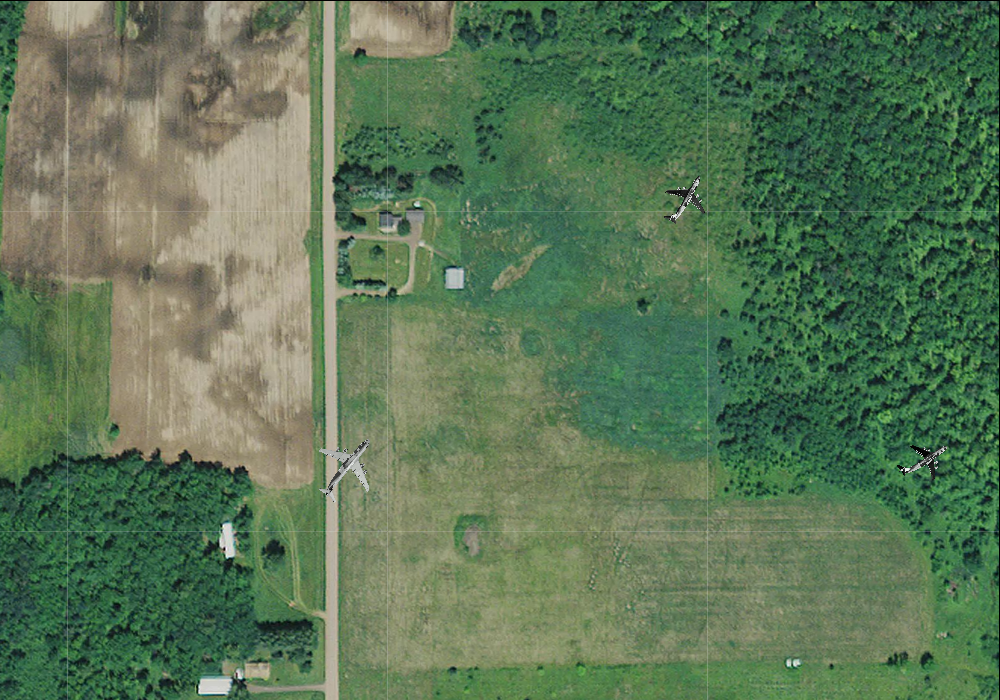

In [ ]:
TRAIN_DATA_DIR = Path("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train/")
train_img_list = list(TRAIN_DATA_DIR.glob("images/*.png"))
pickone = random.choice(train_img_list)

IPython.display.Image(pickone)

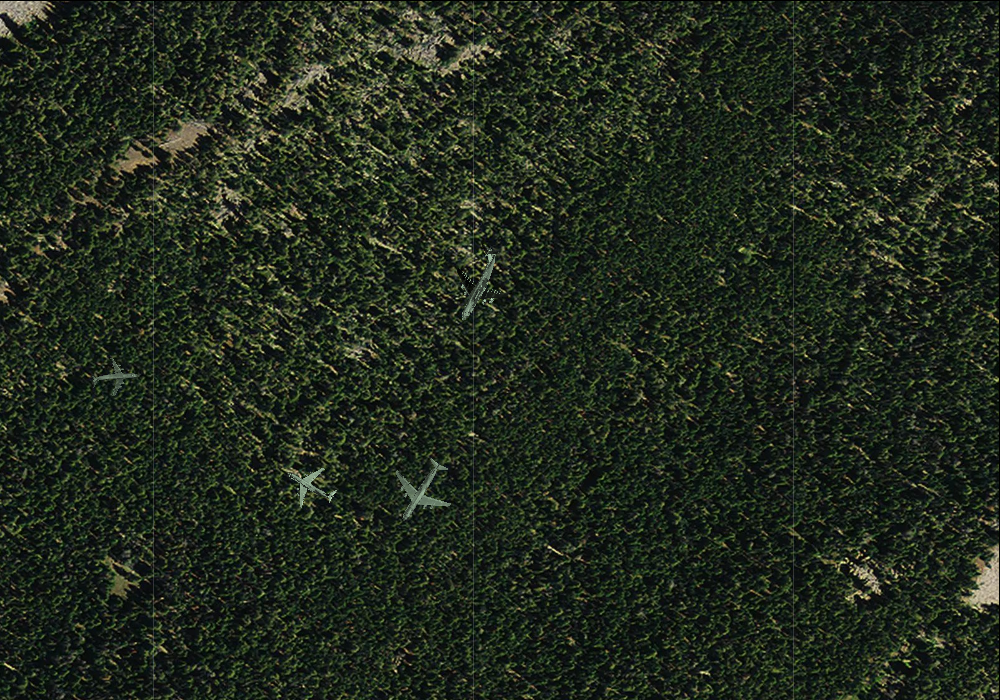

In [ ]:
pickone = random.choice(train_img_list)
IPython.display.Image(pickone)

In [ ]:
print(f"Found {len(train_img_list)} training images files in {TRAIN_DATA_DIR}")

img = PIL.Image.open(pickone)
IMAGE_HEIGHT, IMAGE_WIDTH = img.size
num_channels = len(img.mode)
print("Image size: {}".format((IMAGE_HEIGHT, IMAGE_WIDTH)))
print("Num channels: {}".format(num_channels))

Found 329 training images files in /content/drive/MyDrive/ML/airplane-detection-for-satellites/train
Image size: (1000, 700)
Num channels: 3


In [ ]:
train_annotations_list = list(TRAIN_DATA_DIR.glob("annotations/*.xml"))

print(f"Found {len(train_annotations_list)} training annotations files in {TRAIN_DATA_DIR}")

Found 400 training annotations files in /content/drive/MyDrive/ML/airplane-detection-for-satellites/train


In [ ]:
train_labels_list = list(TRAIN_DATA_DIR.glob("labels/*.txt"))

print(f"Found {len(train_labels_list)} training labels files in {TRAIN_DATA_DIR}")

Found 329 training labels files in /content/drive/MyDrive/ML/airplane-detection-for-satellites/train


In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/ML/airplane-detection-for-satellites/train_labels.csv")

df_train.head(10)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,img1.png,1000,700,plane,410,356,469,419
1,img1.png,1000,700,plane,635,276,738,380
2,img1.png,1000,700,plane,830,46,902,119
3,img1.png,1000,700,plane,669,80,715,120
4,img1.png,1000,700,plane,58,225,108,272
5,img1.png,1000,700,plane,526,279,579,332
6,img1.png,1000,700,plane,822,446,870,493
7,img1.png,1000,700,plane,591,322,664,400
8,img1.png,1000,700,plane,838,227,920,309
9,img1.png,1000,700,plane,605,353,661,415


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3220 entries, 0 to 3219
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  3220 non-null   object
 1   width     3220 non-null   int64 
 2   height    3220 non-null   int64 
 3   class     3220 non-null   object
 4   xmin      3220 non-null   int64 
 5   ymin      3220 non-null   int64 
 6   xmax      3220 non-null   int64 
 7   ymax      3220 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 201.4+ KB


### Test data

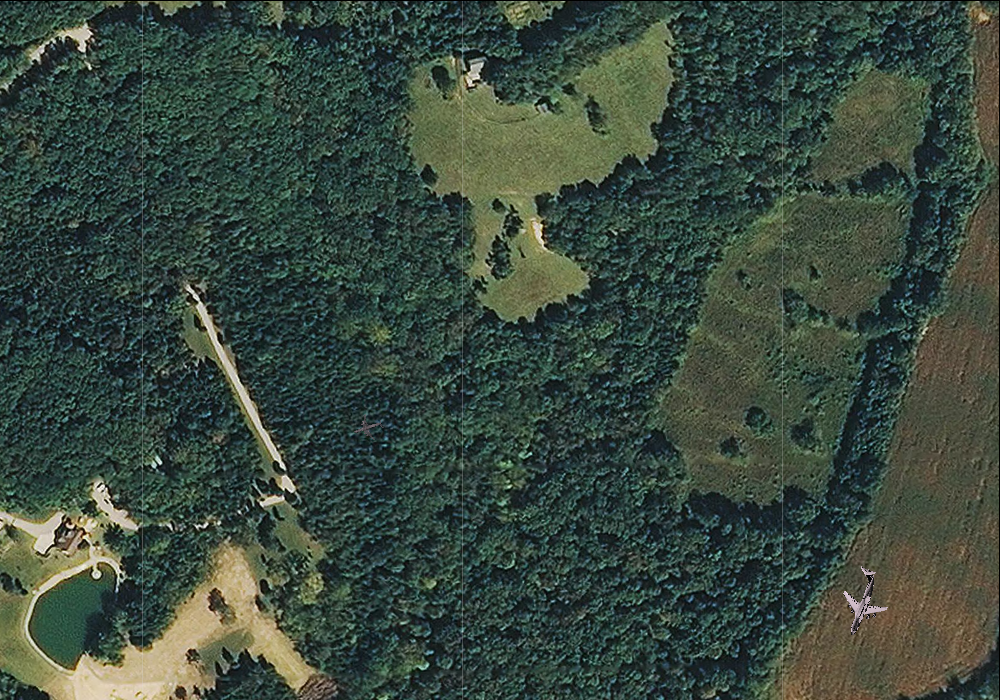

In [ ]:
TEST_DATA_DIR = Path("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/")
test_img_list = list(TEST_DATA_DIR.glob("images/*.png"))
pickone = random.choice(test_img_list)
IPython.display.Image(pickone)

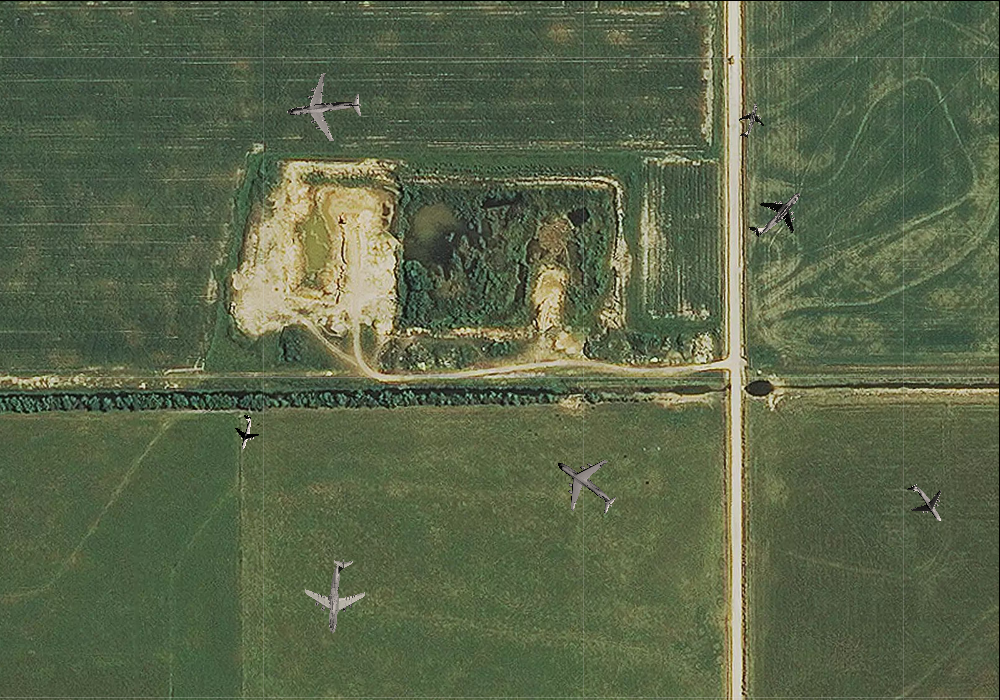

In [ ]:
pickone = random.choice(test_img_list)
IPython.display.Image(pickone)

In [ ]:
print(f"Found {len(test_img_list)} testing images files in {TEST_DATA_DIR}")

img = PIL.Image.open(pickone)
IMAGE_HEIGHT, IMAGE_WIDTH = img.size
num_channels = len(img.mode)
print("Image size: {}".format((IMAGE_HEIGHT, IMAGE_WIDTH)))
print("Num channels: {}".format(num_channels))

Found 99 testing images files in /content/drive/MyDrive/ML/airplane-detection-for-satellites/test
Image size: (1000, 700)
Num channels: 3


In [ ]:
test_annotations_list = list(TEST_DATA_DIR.glob("annotations/*.xml"))

print(f"Found {len(test_annotations_list)} training annotations files in {TEST_DATA_DIR}")

Found 100 training annotations files in /content/drive/MyDrive/ML/airplane-detection-for-satellites/test


In [ ]:
train_labels_list = list(TEST_DATA_DIR.glob("labels/*.txt"))

print(f"Found {len(train_labels_list)} training labels files in {TEST_DATA_DIR}")

Found 99 training labels files in /content/drive/MyDrive/ML/airplane-detection-for-satellites/test


In [ ]:
df_test = pd.read_csv("/content/drive/MyDrive/ML/airplane-detection-for-satellites/test_labels.csv")

df_test.head(10)

,filename,width,height,class,xmin,ymin,xmax,ymax
0,img401.png,1000,700,plane,319,212,403,296
1,img401.png,1000,700,plane,370,222,464,317
2,img401.png,1000,700,plane,718,276,805,366
3,img401.png,1000,700,plane,587,516,637,566
4,img401.png,1000,700,plane,776,513,819,555
5,img401.png,1000,700,plane,306,298,395,390
6,img401.png,1000,700,plane,332,265,393,329
7,img402.png,1000,700,plane,689,572,771,657
8,img402.png,1000,700,plane,411,138,444,170
9,img402.png,1000,700,plane,708,504,772,570


In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 779 entries, 0 to 778
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  779 non-null    object
 1   width     779 non-null    int64 
 2   height    779 non-null    int64 
 3   class     779 non-null    object
 4   xmin      779 non-null    int64 
 5   ymin      779 non-null    int64 
 6   xmax      779 non-null    int64 
 7   ymax      779 non-null    int64 
dtypes: int64(6), object(2)
memory usage: 48.8+ KB


In [ ]:
OUTPUT_DIR = "/content/drive/MyDrive/ML/airplane-detection-for-satellites/output/"

# create the labels folder (output directory)
if not os.path.isdir(OUTPUT_DIR):
  os.mkdir(OUTPUT_DIR)

In [ ]:
CONFIG = """
# train and val datasets (image directory or *.txt file with image paths)
train: /content/drive/MyDrive/ML/airplane-detection-for-satellites/train
val: /content/drive/MyDrive/ML/airplane-detection-for-satellites/test

# number of classes
nc: 1

# class names
names: ['plane']
"""

with open(os.path.join(OUTPUT_DIR, "data.yaml"), "w") as f:
  f.write(CONFIG)

In [ ]:
HOME = OUTPUT_DIR
!yolo task=detect mode=train model=yolov8s.pt data={HOME}/data.yaml epochs=25 imgsz=1024

100% 21.5M/21.5M [00:00<00:00, 219MB/s]
New https://pypi.org/project/ultralytics/8.1.29 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/ML/airplane-detection-for-satellites/output//data.yaml, epochs=25, patience=50, batch=16, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, min_memory=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vi

In [ ]:
!cp -R  ./runs /content/drive/MyDrive/ML/airplane-detection-for-satellites/output
!cp -r yolov*.pt /content/drive/MyDrive/ML/airplane-detection-for-satellites/output

In [ ]:
!ls /content/drive/MyDrive/ML/airplane-detection-for-satellites/output/runs/detect/train/

args.yaml					     R_curve.png	 train_batch317.jpg
confusion_matrix.png				     results.csv	 val_batch0_labels.jpg
events.out.tfevents.1710683691.810232d2d8b6.21900.0  results.png	 val_batch0_pred.jpg
F1_curve.png					     train_batch0.jpg	 val_batch1_labels.jpg
labels_correlogram.jpg				     train_batch1.jpg	 val_batch1_pred.jpg
labels.jpg					     train_batch2.jpg	 val_batch2_labels.jpg
P_curve.png					     train_batch315.jpg  val_batch2_pred.jpg
PR_curve.png					     train_batch316.jpg  weights


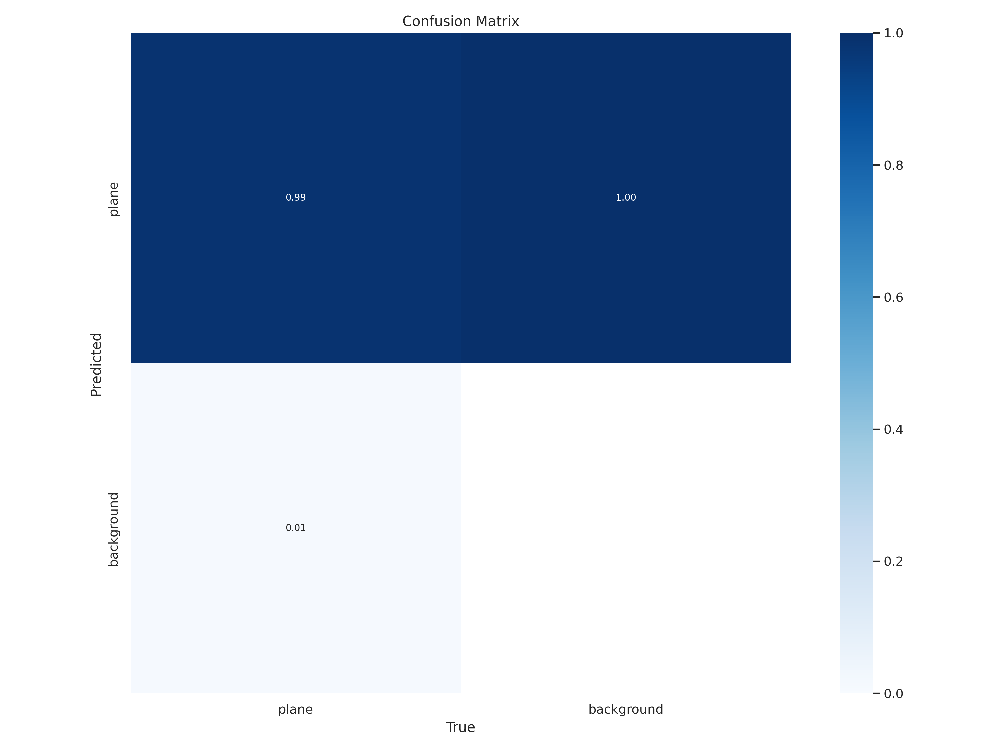

In [ ]:
IPython.display.Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

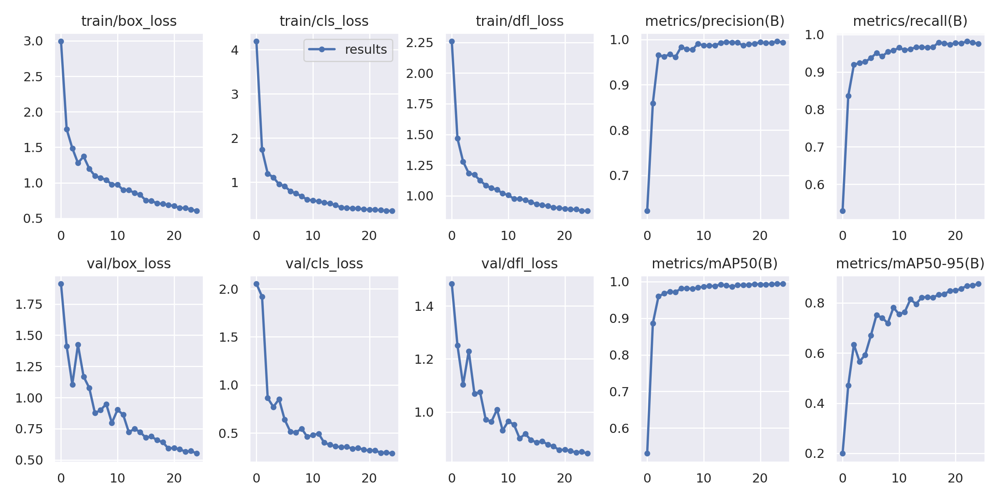

In [ ]:
IPython.display.Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

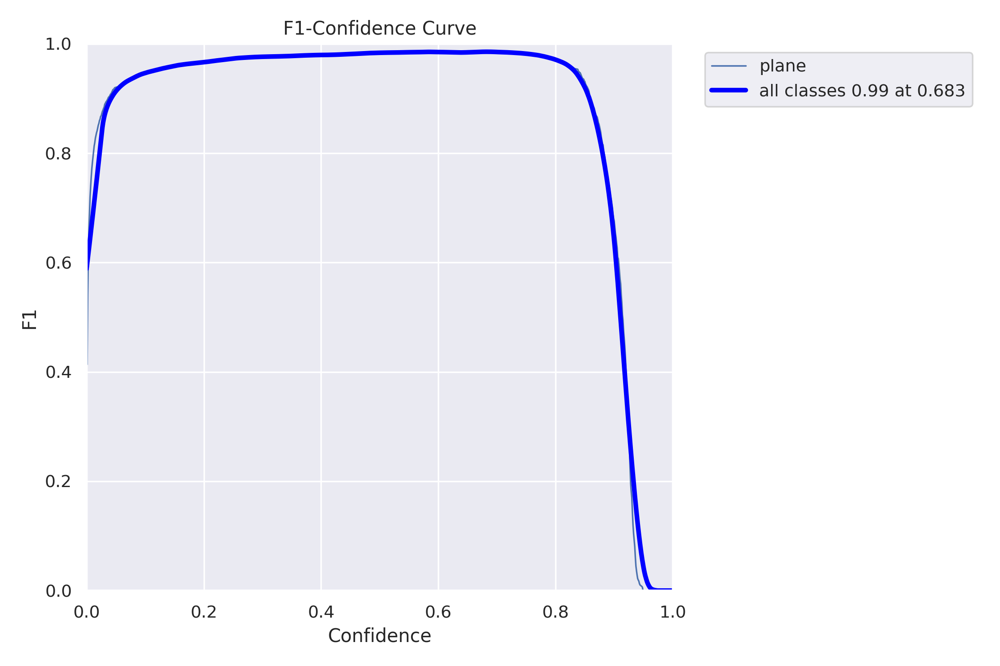

In [ ]:
display.Image(filename=f'{HOME}/runs/detect/train/F1_curve.png', width=600)

In [ ]:
import plotly.express as px
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/ML/airplane-detection-for-satellites/output/runs/detect/train/results.csv")
fig = px.line(df, x='                  epoch', y='       metrics/mAP50(B)', title='mAP50')
fig.show()

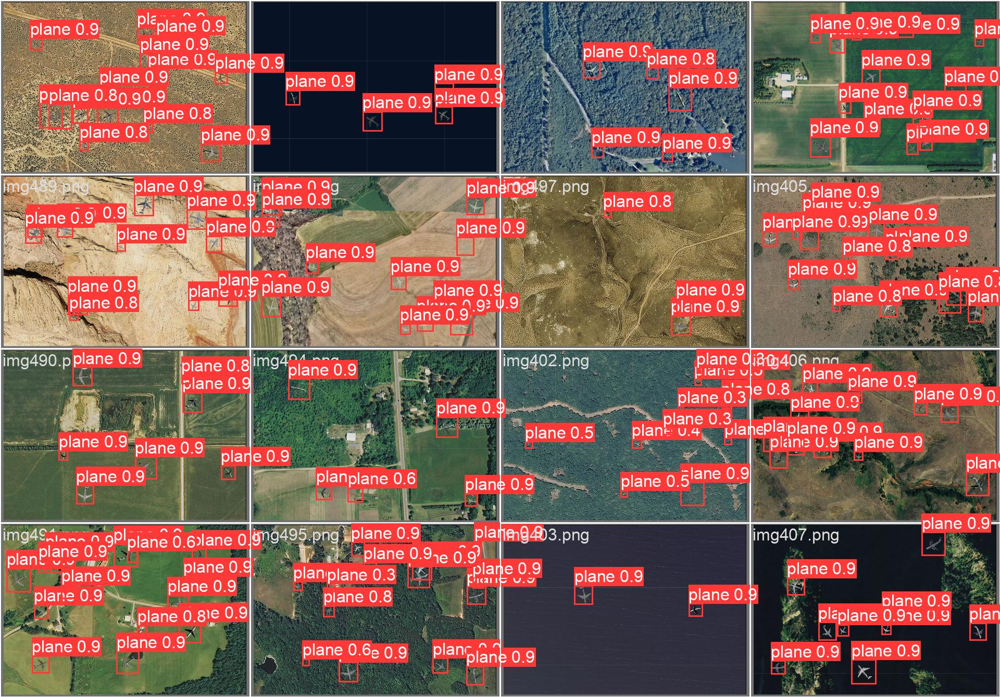

In [ ]:
display.Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=1000)

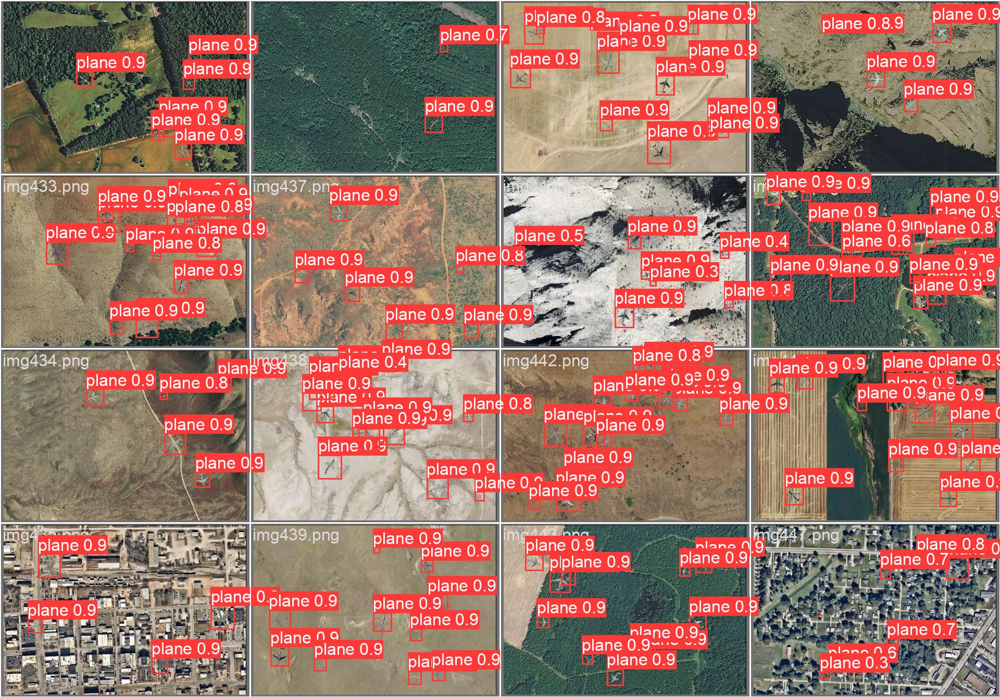

In [ ]:
display.Image(filename=f'{HOME}/runs/detect/train/val_batch1_pred.jpg', width=1000)

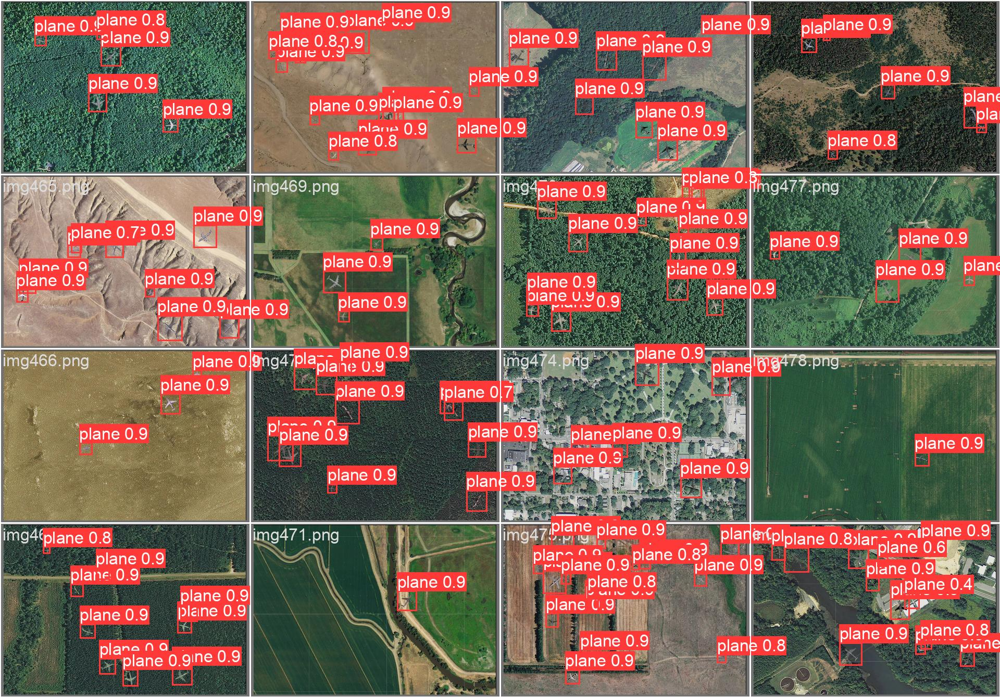

In [ ]:
display.Image(filename=f'{HOME}/runs/detect/train/val_batch2_pred.jpg', width=1000)

## Inference

In [ ]:
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/drive/MyDrive/ML/airplane-detection-for-satellites/test/images/img462.png

2024-03-17 14:20:38.242787: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-17 14:20:38.242841: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-17 14:20:38.244288: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-17 14:20:39.376871: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

image 1/1 /content/drive/MyDrive/ML/airplane-detection-for-satellites/te